In [40]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import pygraphviz
import os
import dill
from scipy.sparse import csr_matrix
from sklearn.preprocessing import MinMaxScaler, StandardScaler

sns.set(style='darkgrid', palette='viridis', context='talk')

os.chdir(os.path.expanduser('~/vivarium-ecoli'))

In [41]:
%%html
<style>
.dataframe th {
    font-size: 12px;
}
.dataframe td {
    font-size: 10px;
}
</style>

In [42]:
import datetime

In [43]:
datetime.date.today()

datetime.date(2023, 4, 6)

# Import

In [44]:
time = '10'
date = '2023-04-06'
experiment = 'fba-redux'
entry = f'{experiment}_{time}_{date}'
folder = f'out/fbagd/{entry}/'

In [45]:
output = np.load(folder + 'output.npy',allow_pickle='TRUE').item()
# output = np.load(r"out/geneRxnVerifData/output_glc.npy", allow_pickle=True, encoding='ASCII').tolist()
output = output['agents']['0']
fba = output['listeners']['fba_results']
mass = output['listeners']['mass']
bulk = pd.DataFrame(output['bulk'])

In [46]:
f = open(folder + 'agent_steps.pkl', 'rb')
agent = dill.load(f)
f.close()

In [47]:
stoichiometry = agent['ecoli-metabolism-redux'].network_flow_model.Sd
# maintenance_reaction = agent['ecoli-metabolism'].model.maintenance_reaction
# stoichiometry["maintenance_reaction"] = maintenance_reaction
#
# bad_rxns = ["RXN-12440", "TRANS-RXN-121", "TRANS-RXN-300", "TRANS-RXN-8"] # generate carbon mistake in parca, efflux/influx proton gen
# for rxn in bad_rxns:
#     stoichiometry.pop(rxn, None)


In [48]:
stoichiometry

,1-ACYLGLYCEROL-3-P-ACYLTRANSFER-RXN,1.1.1.127-RXN,1.1.1.127-RXN (reverse),1.1.1.215-RXN (reverse),1.1.1.251-RXN,1.1.1.251-RXN (reverse),1.1.1.271-RXN (reverse),1.1.1.274-RXN (reverse),1.1.1.283-RXN (reverse),1.1.1.39-RXN,...,XYLISOM-RXN-CPD-15377//D-XYLULOSE.22.,XYLISOM-RXN-CPD-15377//D-XYLULOSE.22. (reverse),XYLISOM-RXN-XYLOSE//D-XYLULOSE.19.,XYLISOM-RXN-XYLOSE//D-XYLULOSE.19. (reverse),XYLONATE-DEHYDRATASE-RXN,XYLULOKIN-RXN,YIAE1-RXN (reverse),YIAE2-RXN (reverse),glycogen-monomer-extension,maintenance_reaction
ACYL-SN-GLYCEROL-3P[c],-1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ACYL-ACP[c],-1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
L-PHOSPHATIDATE[c],1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ACP[c],1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2-DEHYDRO-3-DEOXY-D-GLUCONATE[c],0,-1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CPD-9646[CCI-PERI-BAC-GN],0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
URIDYLYL-PII[c],0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PROTEIN-PII[c],0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
D-XYLULOSE[c],0,0,0,0,0,0,0,0,0,0,...,1,-1,1,-1,0,-1,0,0,0,0


In [54]:
g = nx.algorithms.bipartite.from_biadjacency_matrix(A = csr_matrix(np.array(stoichiometry)[0:200,0:200]))

In [55]:
g_view = nx.nx_agraph.graphviz_layout(g, prog="sfdp")

AttributeError: 'dict' object has no attribute 'is_directed'

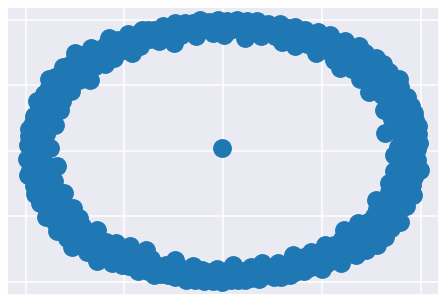

In [56]:
nx.draw(g_view)

In [103]:
counter = 0
for i, reaction in enumerate(stoichiometry):
    for j, reaction2 in enumerate(stoichiometry):
        if reaction['stoichiometry'] == reaction2['stoichiometry'] and i!=j and i<j:
            counter += 1
            print(i, j)

24 2115
97 2269
120 121
139 140
139 141
140 141
152 1676
154 1677
161 165
174 175
174 2588
175 2588
176 178
176 2590
176 2647
176 2686
177 2278
178 2590
178 2647
178 2686
182 339
183 340
183 453
184 341
184 454
185 342
185 455
186 344
186 456
187 345
187 457
188 346
188 458
189 347
189 459
190 348
190 460
191 349
191 461
192 350
192 462
193 351
193 463
194 352
194 464
195 353
195 465
196 354
197 357
198 358
198 466
199 359
200 363
200 467
201 364
202 365
203 367
203 468
204 368
205 369
205 469
206 370
206 470
207 371
207 471
208 372
208 472
209 373
209 473
210 374
210 474
211 375
211 475
212 376
212 476
213 377
213 477
214 378
215 380
216 381
216 478
217 382
217 479
218 383
218 480
219 385
219 481
220 386
221 387
222 388
222 482
223 389
223 483
224 390
224 484
225 391
225 4855
226 392
226 485
228 4368
229 4369
230 4370
231 4371
232 4372
233 4373
234 4374
236 4375
239 4376
240 4377
244 245
246 1898
248 249
260 261
262 1773
287 288
293 4441
294 4440
300 305
311 336
340 453
341 454
342 45

# Plotting

In [104]:
stoichiometry[43]

{'reaction id': '1.8.4.14-RXN-MET/Ox-thioredoxins-1/WATER//CPD-8990/Red-thioredoxins-1.57. (reverse)',
 'stoichiometry': {'MET[c]': 1,
  'Ox-thioredoxins-1[c]': 1,
  'WATER[c]': 1,
  'CPD-8990[c]': -1,
  'Red-thioredoxins-1[c]': -1},
 'is reversible': False,
 'enzyme': ['EG12394-MONOMER[c]', 'CPLX0-8217[c]']}

In [105]:
for i, reaction in enumerate(stoichiometry):
    if len(reaction['enzyme']) > 1:
        print(i)

9
38
39
40
41
42
43
44
45
53
54
55
56
57
67
68
94
107
109
115
116
117
118
119
130
131
132
133
134
136
172
175
177
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
250
251
252
253
257
260
262
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
310
397
430
433
450
451
452
453
454
455
456
457
458
459
460
461
462
463
464
465
466
467
468
469
470
471
472
473
474
475
476
477
478
479
480
481
482
483
484
485
496
499
500
506
509
512
520
521
523
524
556
573
574
576
577
578
579
607
608
610
611
612
634
639
640
662
668
670
671
672
695
696
697
698
699
734
763
765
779
815
823
824
846
847
848
849
850
851
852
853
854
855
856
857
858
867
897
900
921
927
928
929
930
931
951
960
962
964
972
979
993
1017
1018
1039
1058
1060
1063
1064
1072
1077
1102
1103
1104
1105
1106
1120
1127
1141
1146
1198
1224
1225
1226
1227
1248
1249
1250
1251
1252
1253
1254
1255
1256
12

In [106]:
bulk_data = bulk.iloc[-1, :]
bulk_data

CPLX-125[c]          7
CPLX-172[c]          0
CPLX0-226[c]       103
CPLX0-228[c]         9
CPLX0-7669[c]      116
                  ... 
undecaprenyl[m]      0
undecaprenyl[o]      0
undecaprenyl[p]      0
undecaprenyl[l]      0
undecaprenyl[i]      0
Name: 5, Length: 40889, dtype: int64

In [107]:
min(flux_data)

-1.0

In [108]:
flux_data = pd.DataFrame(fba['estimated_fluxes']).iloc[-1, :]

In [109]:
# scaler = StandardScaler()
# flux_values = scaler.fit_transform(np.array(flux_data).reshape(-1, 1)).reshape(-1)
scaler = MinMaxScaler(feature_range=(-1, max(flux_data)/(abs(min(flux_data)))))
flux_values = scaler.fit_transform(np.array(flux_data).reshape(-1, 1)).reshape(-1)
flux_data.iloc[:] = flux_values.tolist()

flux_data

1-ACYLGLYCEROL-3-P-ACYLTRANSFER-RXN    8.185725e-06
1.1.1.127-RXN                          4.815133e-07
1.1.1.215-RXN (reverse)               -1.110223e-16
1.1.1.251-RXN                          2.335339e-05
1.1.1.271-RXN (reverse)                3.129836e-06
                                           ...     
XYLULOKIN-RXN                         -1.110223e-16
YIAE1-RXN (reverse)                   -1.110223e-16
YIAE2-RXN (reverse)                   -1.110223e-16
glycogen-monomer-extension             2.305245e-03
maintenance_reaction                   1.837728e+00
Name: 4, Length: 5669, dtype: float64

In [110]:
cofactors = [
 'PROTON[c]',
 'WATER[c]',
 'OXYGEN-MOLECULE[c]',
 'PROTON[p]',
 'WATER[p]',
 'Pi[c]',
 'PPI[c]',
 'Pi[p]']

In [113]:
G = nx.Graph()

for reaction in stoichiometry:
    for metabolite in list(reaction['stoichiometry'].keys()):
        if metabolite in bulk_data.index:
            G.add_node(metabolite, size=20*np.log(100+abs(bulk_data[metabolite])))
        else:
            G.add_node(metabolite, size=10)

    for reactant in list(reaction['stoichiometry'].keys()):
        if reaction['stoichiometry'][reactant] < 0:
            for product in list(reaction['stoichiometry'].keys()):
                if reaction['stoichiometry'][product] > 0:
                    if G.has_edge(reactant, product):
                        G.edges[reactant, product]['weight'] += 20*flux_data[reaction['reaction id']]
                    else:
                        G.add_edge(reactant, product, weight=20*flux_data[reaction['reaction id']])


                    
# prune smaller graphs away
for subgraph in [G.subgraph(c) for c in nx.connected_components(G)]:
    if subgraph.size() < 100:
        print(subgraph.nodes())
        # G.remove_nodes_from(subgraph.nodes())
        
# remove highly connected nodes (e.g. protons)
highly_connected_nodes = list()
for node in G.nodes():
    if G.degree(node) > 50:
        highly_connected_nodes.append(node)
        
# G.remove_nodes_from(highly_connected_nodes)
G.remove_nodes_from(cofactors)


['PHOSPHO-ARCB-HIS[CCI-PM-BAC-NEG-GN]', 'PHOSPHO-ARCB717[CCI-PM-BAC-NEG-GN]', 'Pi[NIL]', 'ARCB-CPLX[CCI-PM-BAC-NEG-GN]', 'PHOSPHO-ARCB-ASP[CCI-PM-BAC-NEG-GN]']
['PHOSPHO-BAER[c]', 'BAER-MONOMER[c]', 'BAES-MONOMER[CCI-PM-BAC-NEG-GN]', 'PHOSPHO-BAES[CCI-PM-BAC-NEG-GN]']
['WATER[CCI-PERI-BAC-GN]', 'CPD-18901[CCI-PERI-BAC-GN]', 'CPD-606[CCI-PERI-BAC-GN]', 'FAD[CCI-PERI-BAC-GN]', 'CPD-6746[CCI-PERI-BAC-GN]', 'GTP[CCI-PERI-BAC-GN]', 'Protein-flavinated-threonines[CCI-PERI-BAC-GN]', 'Proteins-L-Threonines[CCI-PERI-BAC-GN]', 'CPD-9646[CCI-PERI-BAC-GN]', 'UNDECAPRENYL-DIPHOSPHATE[CCI-PERI-BAC-GN]', 'GDP[CCI-PERI-BAC-GN]', 'ADP[CCI-PERI-BAC-GN]', 'D-ALANINE[CCI-PERI-BAC-GN]', 'PROTON[CCI-PERI-BAC-GN]', 'CPD-18902[CCI-PERI-BAC-GN]', 'GLYCEROL-3P[CCI-PERI-BAC-GN]', 'CPD-18903[CCI-PERI-BAC-GN]', 'Pi[CCI-PERI-BAC-GN]', 'MI-PENTAKISPHOSPHATE[CCI-PERI-BAC-GN]', 'CPD-17927[CCI-PERI-BAC-GN]', 'CYTIDINE[CCI-PERI-BAC-GN]', 'ADENOSINE5TRIPHOSPHO5ADENOSINE[CCI-PERI-BAC-GN]', 'CPD-17926[CCI-PERI-BAC-GN]', 'A

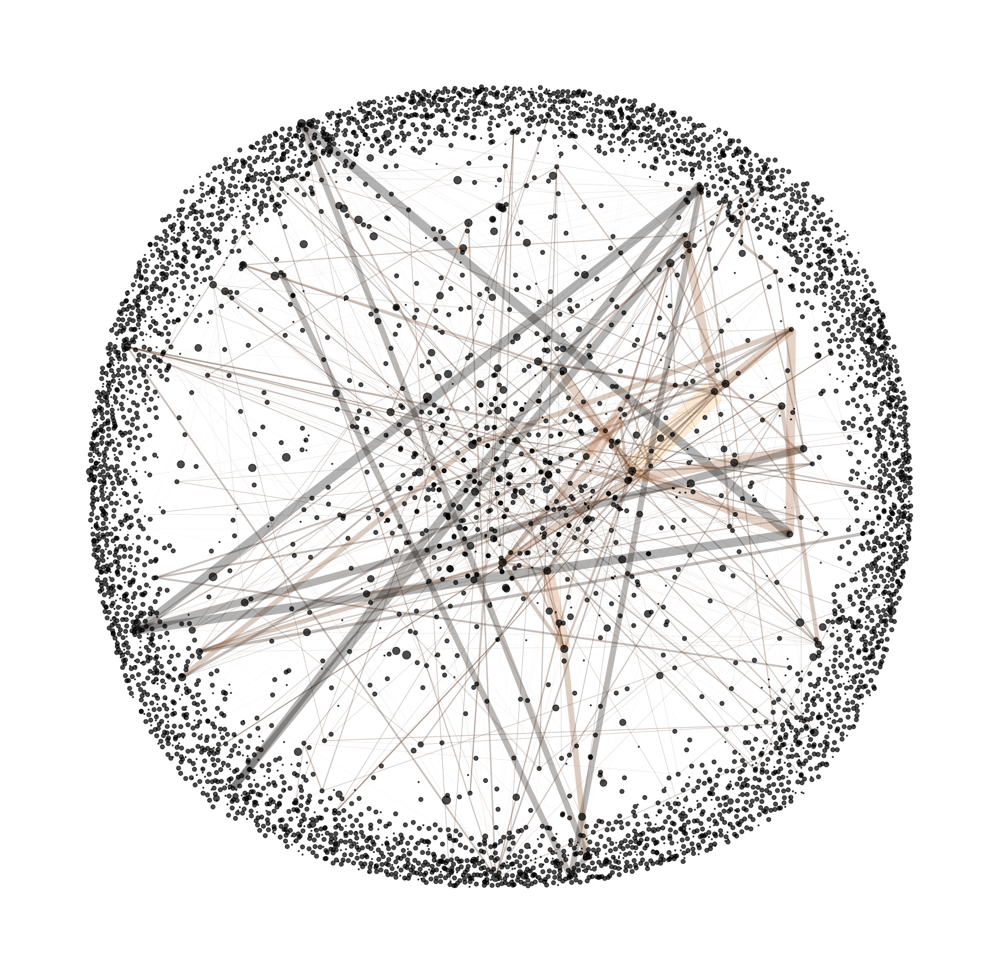

In [112]:
widths = nx.get_edge_attributes(G, 'weight')
sizes = nx.get_node_attributes(G, 'size')
nodelist = G.nodes()

plt.figure(figsize=(40,40))

pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G,pos,
                       nodelist=nodelist,
                       node_size=list(sizes.values()),
                       node_color='black',
                       alpha=0.7)
nx.draw_networkx_edges(G,pos,
                       edgelist = widths.keys(),
                       width=list(widths.values()),
                       edge_color=list(widths.values()),
                       # edge_color='lightblue',
                       alpha=0.3,
                       edge_cmap=plt.cm.copper)
# nx.draw_networkx_labels(G, pos=pos,
#                         labels=dict(zip(nodelist,nodelist)),
#                         font_color='black')
plt.box(False)
plt.show()

# consider shell layout or multipartite

In [17]:
important_exchanges = pd.DataFrame(fba['estimated_exchange_dmdt']).iloc[-1, :]
important_exchanges = important_exchanges[abs(important_exchanges) > 1000]

important_homeostatic = pd.DataFrame(fba['estimated_homeostatic_dmdt']).iloc[-1, :]
important_homeostatic = important_homeostatic[abs(important_homeostatic) > 1000]

In [18]:
exchange_metabolites = set(important_exchanges.index).intersection(set(G.nodes()))
homeostatic_metabolites = set(important_homeostatic.index).intersection(set(G.nodes()))

# exchange_metabolites = set(fba['estimated_exchange_dmdt'].keys()).intersection(set(G.nodes()))
# homeostatic_metabolites = set(fba['estimated_homeostatic_dmdt'].keys()).intersection(set(G.nodes()))

In [19]:
shortest_paths = nx.multi_source_dijkstra_path_length(G, sources=exchange_metabolites, cutoff=None, weight=1)
shortest_paths_target = nx.multi_source_dijkstra_path_length(G, sources=homeostatic_metabolites, cutoff=None, weight=1)

In [20]:
n_bins = max(shortest_paths.values()) + 1

In [21]:
bins = [[] for x in range(n_bins)]

for key, value in shortest_paths.items():
    bins[value].append(key)

In [22]:
weird_nodes = set(G.nodes()) - set(shortest_paths.keys())
display_nodes = set(shortest_paths.keys()).intersection(set(G.nodes()))
G.remove_nodes_from(weird_nodes)

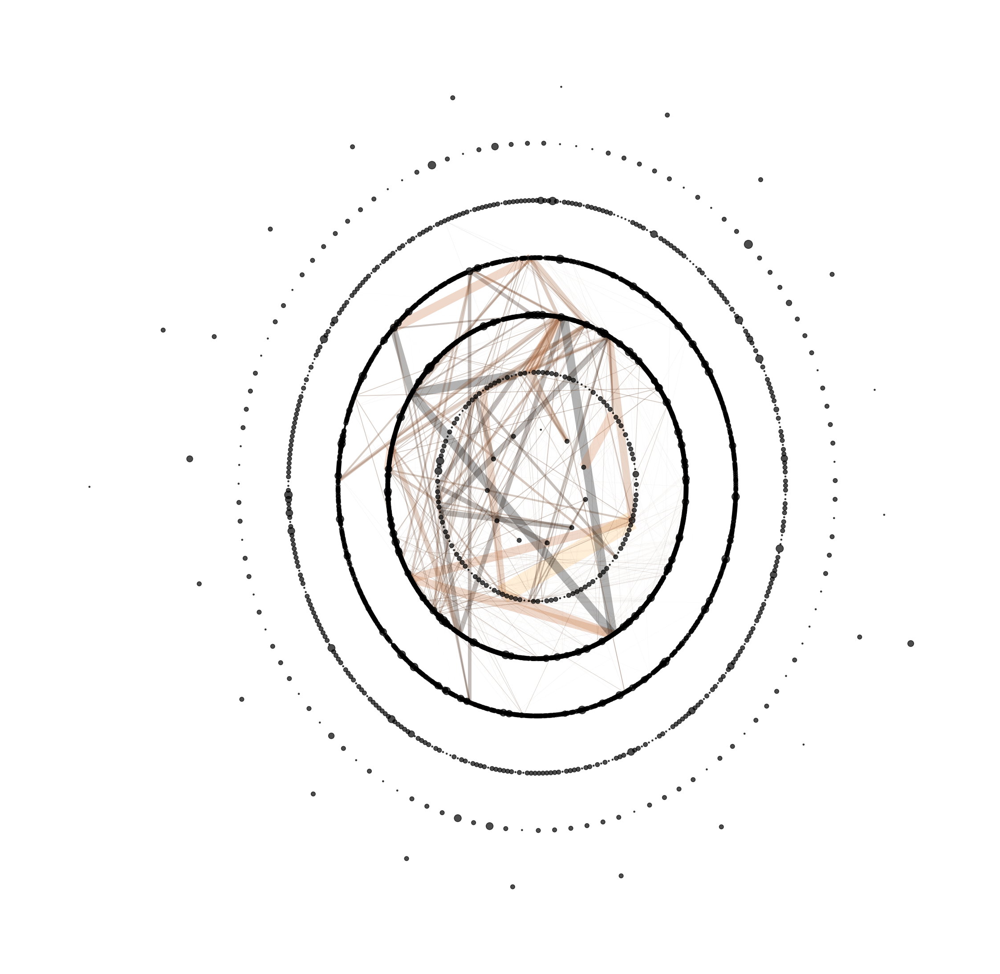

In [23]:
widths = nx.get_edge_attributes(G, 'weight')
sizes = nx.get_node_attributes(G.subgraph(display_nodes), 'size')
nodelist = display_nodes # G.nodes()

plt.figure(figsize=(40,40))

pos = nx.shell_layout(G, nlist=bins)
nx.draw_networkx_nodes(G,pos,
                       nodelist=nodelist,
                       node_size=list(sizes.values()),
                       node_color='black',
                       alpha=0.7)
nx.draw_networkx_edges(G,pos,
                       edgelist = widths.keys(),
                       width=list(widths.values()),
                       edge_color=list(widths.values()),
                       # edge_color='lightblue',
                       alpha=0.3,
                       edge_cmap=plt.cm.copper)
# nx.draw_networkx_labels(G, pos=pos,
#                         labels=dict(zip(nodelist,nodelist)),
#                         font_color='black')
plt.box(False)
plt.show()

# consider shell layout or multipartite

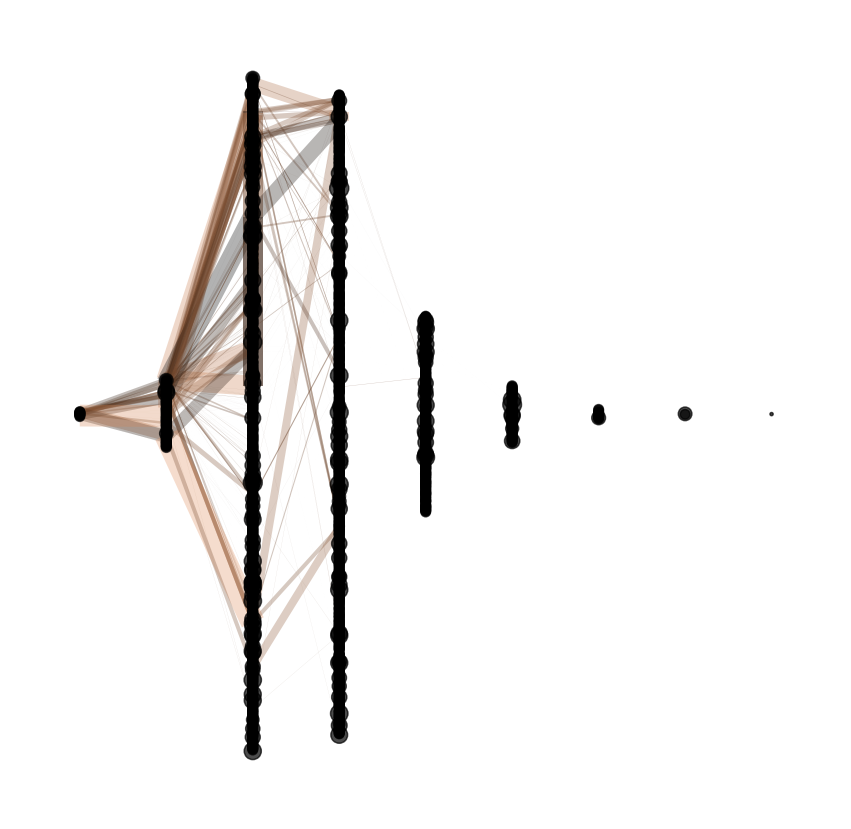

In [24]:
shortest_paths_dict = {key: {'layers': value} for key, value in shortest_paths.items()}

nx.set_node_attributes(G, shortest_paths_dict)

widths = nx.get_edge_attributes(G, 'weight')
sizes = nx.get_node_attributes(G.subgraph(display_nodes), 'size')
nodelist = display_nodes # G.nodes()

plt.figure(figsize=(15,15))

pos = nx.multipartite_layout(G, subset_key='layers')
nx.draw_networkx_nodes(G,pos,
                       nodelist=nodelist,
                       node_size=list(sizes.values()),
                       node_color='black',
                       alpha=0.7)
nx.draw_networkx_edges(G,pos,
                       edgelist = widths.keys(),
                       width=list(widths.values()),
                       edge_color=list(widths.values()),
                       # edge_color='lightblue',
                       alpha=0.3,
                       edge_cmap=plt.cm.copper)
# nx.draw_networkx_labels(G, pos=pos,
#                         labels=dict(zip(nodelist,nodelist)),
#                         font_color='black')
plt.box(False)
plt.show()

# consider shell layout or multipartite

In [25]:
n_bins_target = max(shortest_paths.values()) + 1

In [26]:
bins_dual = [[] for x in range(n_bins_target)]

for key, value in shortest_paths.items():
    if shortest_paths[key] < shortest_paths_target[key]:
        bins_dual[value].append(key)
    else:
        bins_dual[n_bins-1-shortest_paths_target[key]].append(key)

In [27]:
shortest_paths['PTSH-MONOMER[c]']

1

In [28]:
# remove low flux metabolites (unused)
low_flux_nodes = list()

for node in G.nodes():
    weight_sum = 0
    for edge in G.edges(node, data=True):
        weight_sum += edge[2]['weight']
    if weight_sum < 1 and weight_sum > -1: # modify
        low_flux_nodes.append(node)

high_flux_labels = {}    
for node in G.nodes():
    if node not in low_flux_nodes:
        high_flux_labels[node] = node

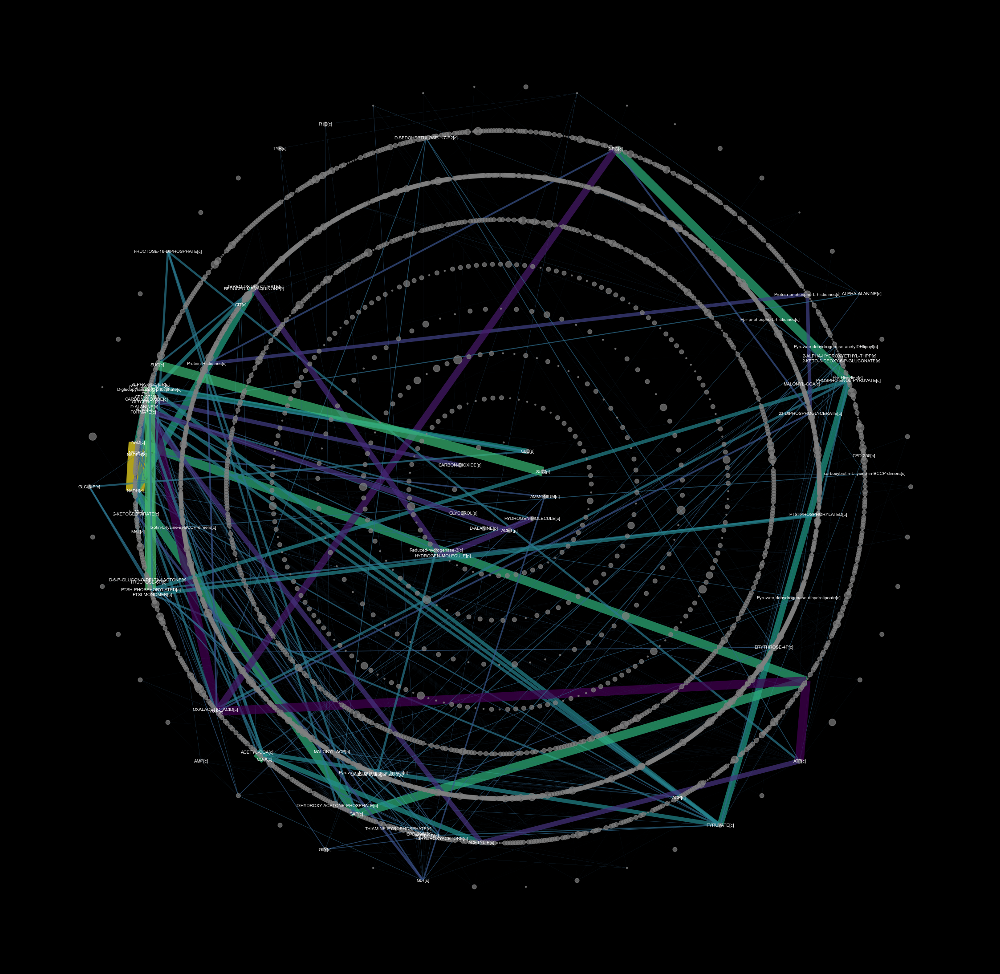

In [29]:
widths = nx.get_edge_attributes(G, 'weight')
sizes = nx.get_node_attributes(G.subgraph(display_nodes), 'size')
nodelist = display_nodes # G.nodes()

plt.figure(figsize=(40,40), facecolor='black')

pos = nx.shell_layout(G, nlist=bins_dual)
nx.draw_networkx_nodes(G,pos,
                       nodelist=nodelist,
                       node_size=list(sizes.values()),
                       node_color='grey',
                       alpha=0.7)
nx.draw_networkx_edges(G,pos,
                       edgelist = widths.keys(),
                       width=list(widths.values()),
                       edge_color=list(widths.values()),
                       # edge_color='lightblue',
                       alpha=0.7,
                       edge_cmap=plt.cm.viridis)
nx.draw_networkx_labels(G, pos=pos,
                        labels=high_flux_labels,
                        font_color='white',
                        font_size=10)
plt.box(False)
plt.grid(False)
plt.show()

# consider shell layout or multipartite

In [30]:
shortest_paths_dict = {}

for i, bin_layer in enumerate(bins_dual):
    for key in bin_layer:
        shortest_paths_dict[key] = {'layers': i}

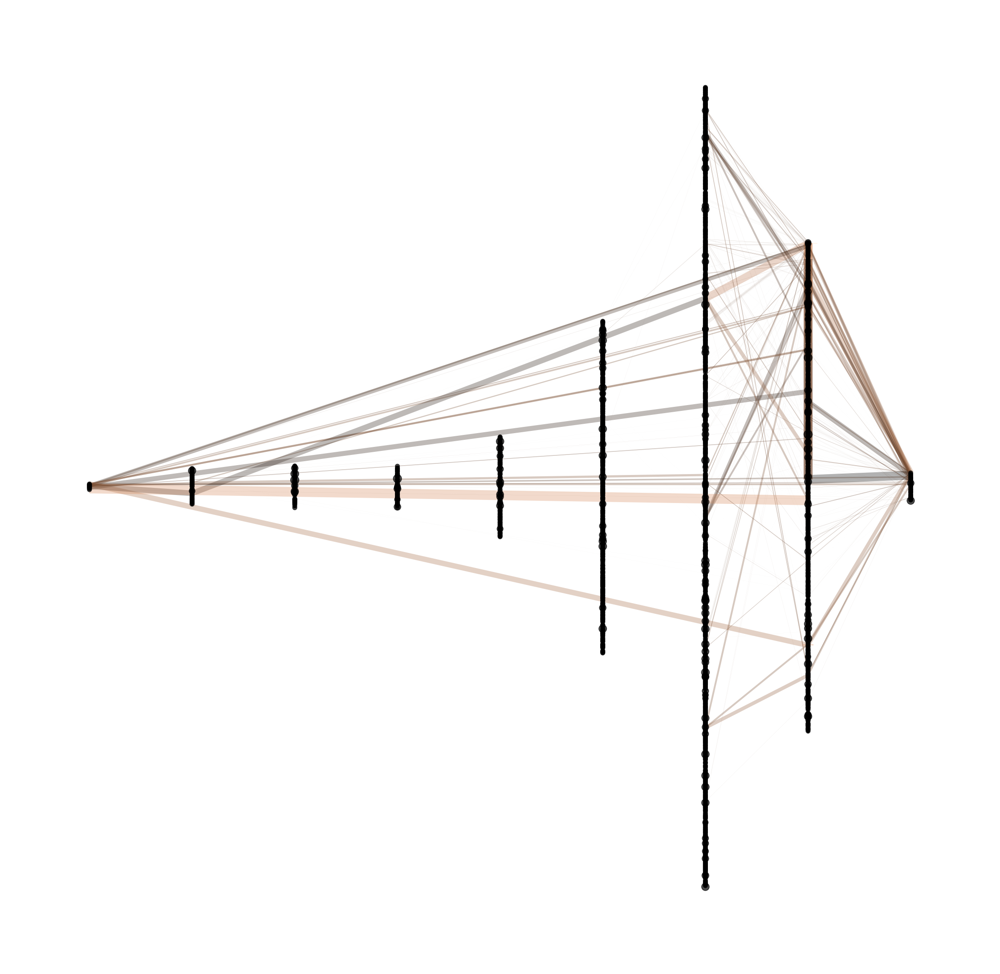

In [31]:

nx.set_node_attributes(G, shortest_paths_dict)

widths = nx.get_edge_attributes(G, 'weight')
sizes = nx.get_node_attributes(G.subgraph(display_nodes), 'size')
nodelist = display_nodes # G.nodes()

plt.figure(figsize=(40,40))

pos = nx.multipartite_layout(G, subset_key='layers')
nx.draw_networkx_nodes(G,pos,
                       nodelist=nodelist,
                       node_size=list(sizes.values()),
                       node_color='black',
                       alpha=0.7)
nx.draw_networkx_edges(G,pos,
                       edgelist = widths.keys(),
                       width=list(widths.values()),
                       edge_color=list(widths.values()),
                       # edge_color='lightblue',
                       alpha=0.3,
                       edge_cmap=plt.cm.copper)
# nx.draw_networkx_labels(G, pos=pos,
#                         labels=dict(zip(nodelist,nodelist)),
#                         font_color='black')
plt.box(False)
plt.show()

# consider shell layout or multipartite